# Load in MNIST dataset and run PCA

Below we simply load in the publicly available MNIST dataset and run PCA on it. Recall that this is simply
finding the top eigenvectors/eigenvalues of the correlation matrix. Notice how certain clusters are formed. 

//anaconda/lib/python2.7/site-packages/sklearn/utils/deprecation.py:52: DeprecationWarning: Class RandomizedPCA is deprecated; RandomizedPCA was deprecated in 0.18 and will be removed in 0.20. Use PCA(svd_solver='randomized') instead. The new implementation DOES NOT store whiten ``components_``. Apply transform to get them.
  warnings.warn(msg, category=DeprecationWarning)


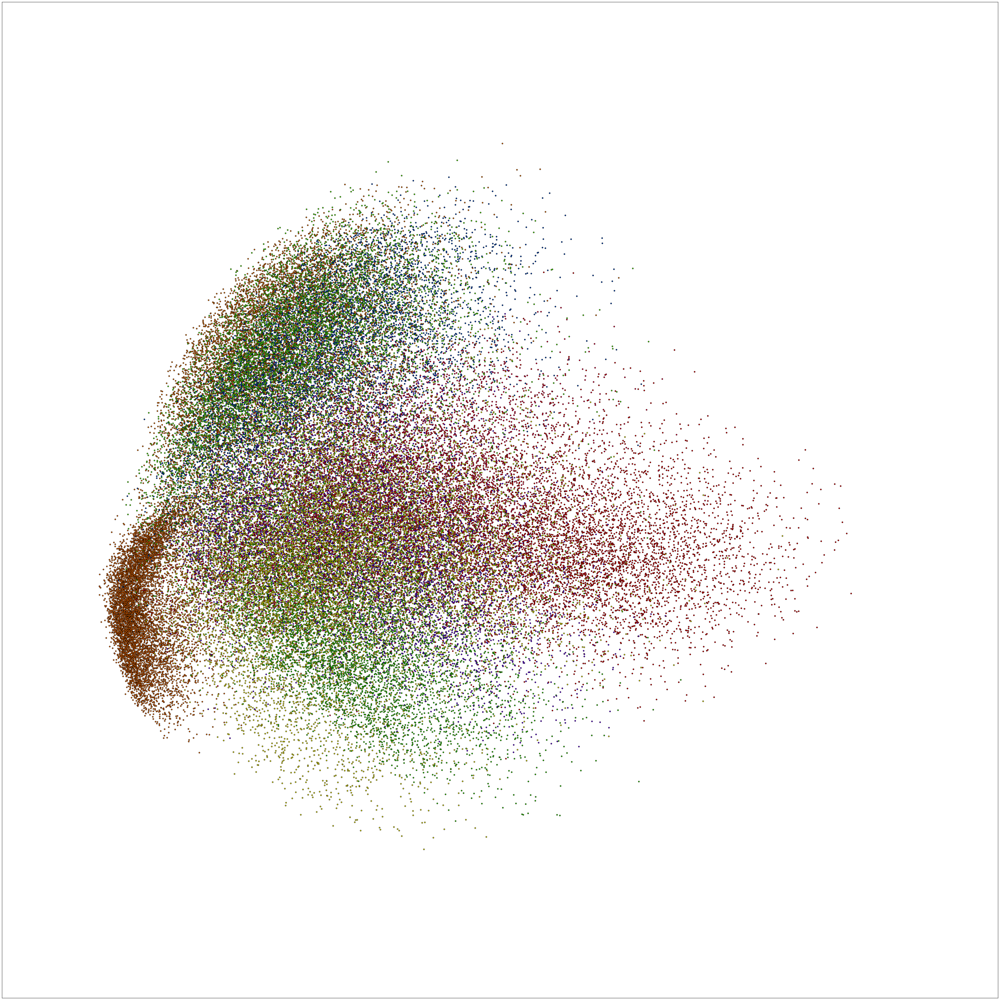

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from sklearn.decomposition import RandomizedPCA
from sklearn.datasets import fetch_mldata
from sklearn.utils import shuffle
%matplotlib inline
#use all digits
mnist = fetch_mldata("MNIST original")
X_train, y_train = mnist.data[:70000] / 255., mnist.target[:70000]

# This is equivalent to finding the top two eigenvalues of X^TX and plotting it. 
pca = RandomizedPCA(n_components=2)
fig, plot = plt.subplots()
fig.set_size_inches(50, 50)
plt.prism()

X_transformed = pca.fit_transform(X_train)
plot.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y_train)
plot.set_xticks(())
plot.set_yticks(())

plt.tight_layout()
plt.savefig("mnist_pca.png")

# Plot the variance explained in terms of the number of components

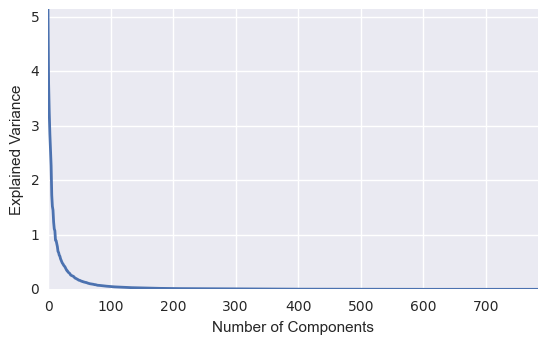

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

logistic = linear_model.LogisticRegression()

pca = decomposition.PCA()
pipe = Pipeline(steps=[('pca', pca), ('logistic', logistic)])

digits = datasets.load_digits()
X_digits = digits.data
y_digits = digits.target
pca.fit(X_train)

plt.figure(1, figsize=(7, 4))
plt.clf()
plt.axes([.2, .2, .7, .7])
plt.plot(pca.explained_variance_, linewidth=2)
plt.axis('tight')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')